# CAGINALP

Ver https://zerowithdot.com/financial-independence-ode-python/

El único concepto de valor se relaciona con los precios recientes. Es decir, escribimos
\begin{equation}
    \label{fundamental value}
    P_a(t)=\frac{1}{c_3}\int_{-\infty}^te^{-(t-\tau)/c_3}P(\tau)d\tau;
\end{equation}

Ratio de transición  de dinero a activo, $k$, dado por
$$k=\frac{1}{2}\left(1+\tanh \zeta\right),$$
donde $\zeta(t)=\zeta_1(t)+\zeta_2(t)$ y
\begin{align*}
\label{investor sentiment}
    \zeta_1(t)&=\frac{q_1}{c_1}\int_{-\infty}^te^{-(t-\tau)/c_1}\frac{1}{P(\tau)}\frac{dP(\tau)}{d\tau}d\tau,\\
    \zeta_2(t)&=\frac{q_2}{c_2}\int_{-\infty}^te^{-(t-\tau)/c_2}\frac{P_a(\tau)-P(\tau)}{P_a(\tau)}d\tau;
\end{align*}

La liquidez es la suma de la liquidez del grupo de tenedores núcleo, $L_0$, y la cantidad proveniente de los especuladores que actúan sobre el trend reciente
\begin{equation}
    \label{liquidity}
    L(t)=L_0+\frac{L_0}{c}q\int_{-\infty}^te^{-(t-\tau)/c}\frac{\tau_0}{P(\tau)}\frac{dP(\tau)}{d\tau}d\tau.
\end{equation}

## Caso linealizado en el sentiment

Escribiendo el término $k/(1-k)$ en términos de $\zeta_1,\zeta_2$ y linealizando tenemos
    $$\frac{k}{1-k}\sim 1+2\zeta_1+2\zeta_2,$$
y la ecuación del precio queda
\begin{equation}
\label{price eq}
    \frac{\tau_0}{P}\frac{dP}{dt}=(1+2\zeta_1+2\zeta_2)\frac{L}{P}-1;
\end{equation}

Derivando y juntando las ecuaciones anteriores obtenemos
\begin{cases}
\begin{equation*}
        \begin{aligned}
        \tau_0P'&=(1+2\zeta_1+2\zeta_2)L-P,\\
        c_3P_a'&=P-P_a,\\
        cL'&=1-L+q\{(1+2\zeta_1+2\zeta_2)L-P\},\\
        c_1\zeta_1'&=q_1\left((1+2\zeta_1+2\zeta_2)\frac{L}{P}-1\right)-\zeta_1,\\
        c_2\zeta_2'&=q_2\frac{P_a-P}{P_a}-\zeta_2.
    \end{aligned}
\end{equation*}
\end{cases}

Debido a que los cambios de oferta/demanda (con escala $\tau_0$) ocurren mucho mas rapido que las actualizaciones en las percepciones de los agentes (de escalas $c,c_1,c_2$ resp.), y que estos últimos ocurren mas rápido que las actualizaciones en el valor fundamental (escalado por $c_3$), tomamos:

$$\tau_0\ll c,c_1,c_2 \ll c_3.$$
   
Escalamos por $c=c_1=c_2=1$ para simplificar los cálculos y permitimos arbitrarios $\tau_0,c_3$ en el análisis.

Matricialmente tenemos
![Image Test](Sistema.png)

### Simulacion

Vamos a resolver numericamente el sistema de Caginalp anterior. Para eso:

- generaremos valores iniciales para $U_0=[P,P_a,L,\zeta_1,\zeta_2]$ y un intervalo temporal $[0,T]$.
- resolveremos el sistema usando la librería odeint. odeint toma como parámetros la función a integrar, el dato inicial y la secuencia temporal respecto de la cual va a calcular el valor de la función.

Definimos la función a integrar que va a representar el sistema.

In [1]:
using DifferentialEquations
using Plots

In [2]:
# basado en https://nextjournal.com/sosiris-de/ode-diffeq
function caginalp(du,u,p,t)
    #################################
    # definimos las constantes
    #P,L=u
    #P,P_a,L,zeta_1,zeta_2=u
    # recordar la diferencia de escalas tau_0<<c,c_1,c_2<<c_3
    # memorias
    # tomamos c_1=c_2=c
    tau_0,c,c_1,c_2,c_3,q,q_1,q_2=p
    #################################
    # valor auxiliar
    aux=1+2*u[4]+2*u[5]
    # definimos las dinámicas
    du[1]=(aux*u[3]-u[1])/tau_0
    du[2]=(u[1]-u[2])/c_3
    du[3]=(1-u[3]+q*(aux*u[3]-u[1]))/c
    du[4]=(q_1*(aux*u[3]/u[1]-1)-u[4])/c_1
    du[5]=(q_2*(u[2]-u[1])/u[2]-u[5])/c_2
end

caginalp (generic function with 1 method)

Recordemos que la condición de estabilidad decía que el sistema es estable siempre que
\begin{align*}
    \frac{1}{\tau_0}+\frac{1}{c_3}+Q&>0,\\
    \left(\frac{Q}{c_3}+\frac{1}{\tau_0}+2\frac{q_2}{\tau_0}+\frac{1}{\tau_0c_3}\right)\left(\frac{1}{\tau_0}+\frac{1}{c_3}+Q\right)&>\frac{1}{\tau_0c_3},
\end{align*}
con $Q=1-q-2q_1$.

Un conjunto de condiciones suficientes para asegurar lo anterior es
\begin{align*}
    \frac{1}{\tau_0}+\frac{1}{c_3}&>q+2q_1=:K,\\
    \frac{1}{\tau_0}+\frac{1}{c_3}&>\frac{K}{c_3}-2\frac{q_2}{\tau_0}.
\end{align*}

# Vamos por partes

$$\frac{\tau_0}{P}\frac{dP}{dt}=(1+2\zeta_1+2\zeta_2)\frac{L}{P}-1$$

Vayamos incrementando la complejidad del modelo para entender poco a poco cómo van afectando los distintos parámetros con vista a introducir delay mas adelante.

### 1. $P_a,L$ ctes

Tomemos

\begin{align*}
    P_a&\equiv cte\\
    L&\equiv cte\\
    \zeta_1&=q_1\frac{1}{P(t)}\frac{dP(t)}{dt},\\
    \zeta_2&=q_2\frac{P_a-P(t)}{P_a}.
\end{align*}

Luego
$$1+2\zeta_1(t)+2\zeta_2(t)=1+2q_1\frac{1}{P(t)}\frac{dP(t)}{dt}+2q_2\frac{P_a-P(t)}{P_a}.$$

Y tenemos

\begin{align*}
    \tau_0\frac{dP}{dt}(t)&=(1+2\zeta_1+2\zeta_2)L-P(t)\\
    &=\left(1+2q_1\frac{1}{P(t)}\frac{dP(t)}{dt}+2q_2\frac{P_a-P(t)}{P_a}\right)L-P(t)
\end{align*}

Nos queda entonces que $P(t)$ tiene la dinámica

\begin{align*}
    \tau_0\frac{dP}{dt}(t)\left(1-2q_1\frac{L}{P(t)}\right)&=\left(1+2q_2\frac{P_a-P(t)}{P_a}\right)L-P(t)
\end{align*}

In [3]:
# basado en https://nextjournal.com/sosiris-de/ode-diffeq
function caginalp_simple(du,u,p,t)
    #################################
    # definimos las constantes
    #P,L=u
    #P,P_a,L,zeta_1,zeta_2=u
    # recordar la diferencia de escalas tau_0<<c,c_1,c_2<<c_3
    # memorias
    # tomamos c_1=c_2=c
    tau_0,c,c_1,c_2,c_3,q,q_1,q_2=p
    P_a=u[2]
    L=u[3]
    #################################
    # valor auxiliar
    # definimos las dinámicas
    if(u[1]!=2*q_1*L)
        du[1]=((1+2*q_2/c_2*(1-u[1]/P_a))*L-u[1])*(u[1]/(tau_0*u[1]-2*tau_0*q_1/c_1*L))
    else
        print("cte_1=cte_2")
    end
end

caginalp_simple (generic function with 1 method)

Definimos una función que simula $P$ para los datos y parámetros iniciales $u_0=[P_0,P_a,L]$ y $p=[\tau_0,c,c_1,c_2,c_3,q,q_1,q_2]$.

In [4]:
using DiffEqCallbacks, OrdinaryDiffEq, LinearAlgebra
function caginalp_simple_sim(u_0,tspan,p)
    tau_0,c,c_1,c_2,c_3,q,q_1,q_2=p
    prob=ODEProblem(caginalp_simple,u_0,tspan,p);
    saved_values = SavedValues(Float64, Vector{Float64})
    cb = SavingCallback((u, t, integrator)->integrator(t,Val{1}), saved_values, saveat=0.0:0.01:100.0) 
    # cb guarda du/dt en saved_values para t in saveat=0.0:0.01:100.0
    # donde 0.0:0.01:100.0 es t_0:step:T
    sol = solve(prob, Tsit5(), callback=cb)
#     sol=solve(prob);
    Q=1-q-2*q_1
    [Q+1/tau_0>0,# condicion de estabilidad
        plot(sol,label=["P" "P_a" "L"]),
    sol,
    saved_values]
end

caginalp_simple_sim (generic function with 1 method)

In [5]:
A=0.0:0.01:10.0
A[1000]

9.99

### 1.1 No irracional, $q_1=0$

\begin{align*}
    \tau_0\frac{dP}{dt}(t)&=\left(1+2q_2\frac{P_a-P(t)}{P_a}\right)L-P(t)
\end{align*}

Busquemos el equilibrio, i.e. $t=t_{eq}$ tal que $\frac{dP}{dt}(t)=0$

\begin{align*}
    P(t)&=L\left[1+2q_2\left(1-\frac{P(t)}{P_a}\right)\right] \Leftrightarrow \\
    P(t)\left[1+2q_2\frac{L}{P_a}\right]&=L(1+2q_2) \Leftrightarrow \\
    P(t)&=\frac{L(1+2q_2)}{1+2q_2\frac{L}{P_a}}
\end{align*}

Uno ve entonces que
$$P(t)\to\begin{cases}
    \frac{2L}{2\frac{L}{P_a}}=P_a, \ \text{cuando } q_2\to\infty \\
    L, \ \text{cuando } q_2\to0
\end{cases}$$

Chequeamos que esto mismo se observa en las simulaciones para $P_0=15, P_a=5, L=5, q_2=2$.

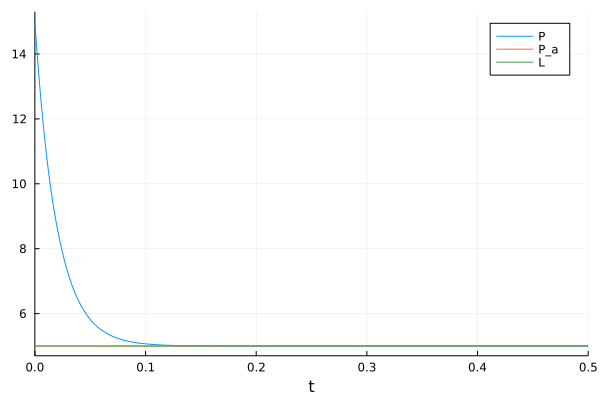

In [6]:
P_0=15
P_a=5
L=5
q_2=2
# aux=(1+2*q_2)/(2*(1+2*q_2*L/P_a))
q_1=0
# cte_1=2*q_1*L
cte_2=L*(1+2*q_2)/(1+2*q_2*L/P_a)
A=caginalp_simple_sim(
        [P_0,#P_0
        P_a,#Pa=cte
        L],#L=cte
    (0.0,0.5),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=1,q_1=q_1,q_2=q_2)#parameters
)
A[2]

In [7]:
cte_2

5.0

In [8]:
A[3].u

14-element Vector{Vector{Float64}}:
 [15.0, 5.0, 5.0]
 [7.8311957129210334, 5.0, 5.0]
 [6.616806527735361, 5.0, 5.0]
 [5.585671214925574, 5.0, 5.0]
 [5.2510766337518815, 5.0, 5.0]
 [5.080975228080128, 5.0, 5.0]
 [5.024977434724386, 5.0, 5.0]
 [5.005788725600132, 5.0, 5.0]
 [5.001096009152341, 5.0, 5.0]
 [5.000168694273264, 5.0, 5.0]
 [5.000043157886319, 5.0, 5.0]
 [5.000055849256174, 5.0, 5.0]
 [5.000265923901982, 5.0, 5.0]
 [5.000071860831015, 5.0, 5.0]

Es decir, $P$ tiende a $cte_2$.

### 1.2 No racional, $q_2=0$

\begin{align*}
    \tau_0\frac{dP}{dt}(t)\left(1-2q_1\frac{L}{P(t)}\right)&=L-P(t)
\end{align*}

Busquemos el equilibrio, i.e. $t=t_{eq}$ tal que $\frac{dP}{dt}(t)=0$

#### 1.2.1 $\tau_0P(t)-2\tau_0q_1L\neq 0$

Entonces se debe cumplir

\begin{align*}
        \frac{dP}{dt}(t)=\frac{L-P(t)}{\tau_0\left(1-2q_1\frac{L}{P(t)}\right)}
\end{align*}

#### 1.2.1 $\tau_0P(t)-2\tau_0q_1L= 0$

Entonces se debe cumplir

\begin{align*}
        1-2q_1\frac{L}{P(t)}&=0 \Rightarrow P(t)=2q_1L\equiv cte_1;\\
        P(t)&=L
\end{align*}

ie $q_1=\frac{1}{2}$.

¿Qué significa esto?

Significa que si $P$ sigue el modelo anterior para $q_1\neq \frac{1}{2}$ entonces no va a pasar que $P$ toque $cte_1$. En todo caso, la forma de analizar el comportamiento es pensando en el limite $P(t)\to cte_1$. Pensar al sistema discretamente con incrementos dados por $f(P)=\frac{P(L-P)}{P-2q_1L}$.

Ojo! En la simulación uno ve que $P$ toca $cte_1$ pero lo que ocurre es que numéricamente $P$ está tocando valores cercanos y luego el sistema interpola.

#### 1.2.1 $\tau_0P(t)-2\tau_0q_1L\to 0$

Sea 
$$f_{L}^{q_1}(P):=\frac{dP}{dt}=\frac{P(L-P)}{P-2q_1L},$$
entonces los incrementos discretos de $P(t)$ están dados por (si dividimos el intervalo $[0,T]$ en $N$ pedazos, es $k=\frac{T}{N}=dt$)
$$P_{k+1}=P_k+dt\frac{1}{\tau_0}f_{L}^{q_1}(P_k)$$

ie
$$P(t_0+dt)=P_0+t\frac{1}{\tau_0}f_{L}^{q_1}(P_0)$$

##### Análisis de $f_{L}^{q_1}$

\begin{itemize}
    \item $I^0=\{0\}$
    \item $I^+=(L,cte_1), \ I^-=(0,L)\cup(cte_1,+\infty)$
    \item $I^{\uparrow}=(0,cte_1),\ I^{\downarrow}=(cte_1,\infty)$
    \item $AV=\{cte_1\}, AO=\{h(x)=-x+L(1-2q_1)\}$
\end{itemize}

Veamos que forma tiene $f_{L}^{q_1}(P)$ para $L=5,q_1=1$ (arbitrarios).

Veamos lo que se observa en las simulaciones para $P_0=15, P_a=5, L=5, q_1=1$.

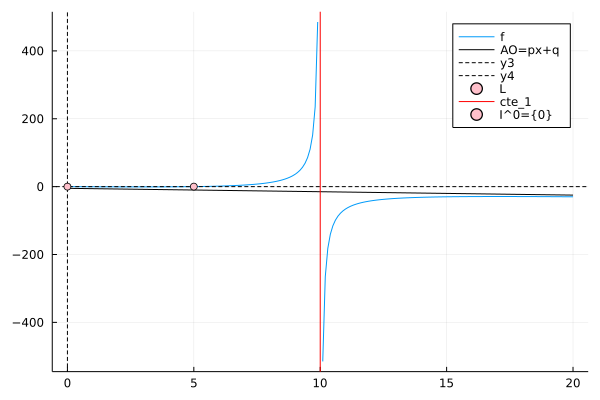

In [9]:
P_a=15
L=5
q_1=1
cte_1=2*q_1*L
P_0=[L-1,L+1,cte_1+1]
f(P,L,q_1)=P*(L-P)/(P-2*q_1*L)
f_1(P)=f(P,L,1)
AO(x)=-x+L*(1-2*q_1)
P=0:0.1:20
#plotlyjs()
plot(f_1,P,lab="f")
plot!(AO,P, lab="AO=px+q",c=:black)
vline!([0],linestyle=:dash, c=:black)
hline!([0],linestyle=:dash, c=:black)
# vline!([P_0[1]],lab="P_0[1]",linestyle=:dash,c=:orange)
# vline!([P_0[2]],lab="P_0[2]",linestyle=:dash,c=:orange)
# vline!([P_0[3]],lab="P_0[3]",linestyle=:dash,c=:orange)
#vline!([P_a],lab="P_a")
scatter!([L],[0],lab="L",c=:pink)
vline!([cte_1],lab="cte_1",c=:red)
scatter!([0],[0], lab="I^0={0}",c=:pink)

Como $L<cte_1=2q_1L$ tenemos que

\begin{itemize}
    \item Si $P_0\in I^+$ tenderá a crecer cada vez más hasta tocar $cte_1$ y ahí su comportamiento se volverá errático ya que la derivada será infinitamente grande e intercambiando de signo.
    \item Si $P_0\in (0,cte_1)$ tenderá a decrecer acercándose al equilibrio $P=0$; 
    \item Si $P_0\in (cte_1,+\infty)$ tenderá a decrecer acercándose a $cte_1$ y su comportamiento se volverá errático.
\end{itemize}

Chequeamos este comportamiento en la simulación.

In [10]:
P_a=15
L=5
q_2=0
aux=(1+2*q_2)/(2*(1+2*q_2*L/P_a))
q_1=1
cte_1=2*q_1*L
P_0=[L-1,L+1,cte_1+1]
cte_2=L*(1+2*q_2)/(1+2*q_2*L/P_a)
plots= Vector{Plots.Plot{Plots.GRBackend}}() #creo un vector de datos de tipo Plot
for p_0 in P_0
    push!(plots, caginalp_simple_sim(
            [p_0,#P_0
            P_a,#Pa=cte
            L],#L=cte
        (0.0,10),#t
        (tau_0=0.1,
            c=1,c_1=1,c_2=1,c_3=10,
            q=1,q_1=q_1,q_2=q_2)#parameters
    )[2])
end

In [11]:
plot(plots[1], plots[2], plots[3], layout = (1, 3), legend = false)

Se observa lo que mencionamos, si $P$ arranca cerca de $L$ pero con derivada negativa va a tender a estacionarse en el equilibrio $0$. Pero si arranca con derivada positiva o cerca de $cte_1$ va a tender a tener un comportamiento errático.

### 1.3 Con racionalidad e irracionalidad

\begin{align*}
    \tau_0\frac{dP}{dt}(t)\left(1-2q_1\frac{L}{P(t)}\right)&=\left(1+2q_2\frac{P_a-P(t)}{P_a}\right)L-P(t)
\end{align*}

#### 1.3.1 $\tau_0P(t)-2\tau_0\frac{q_1}{c_1}L\neq 0$

Entonces la dinámica de $P$ está dada por

\begin{align*}
        \frac{dP(t)}{dt}&=\left(\left(1+2q_2\left(1-\frac{P(t)}{P_a}\right)\right)L-P(t)\right)\frac{P(t)}{\tau_0(P(t)-2q_1L)}.
\end{align*}

#### 1.3.2 $\tau_0P(t)-2\tau_0\frac{q_1}{c_1}L= 0$

Entonces se debe cumplir

\begin{align*}
        1-2q_1\frac{L}{P(t)}&=0 \Rightarrow P(t)=2q_1L\equiv cte_1;\\
        \left(1+2q_2\left(1-\frac{P(t)}{P_a}\right)\right)L-P(t)&=0\Rightarrow P(t)=\frac{L(1+2q_2)}{1+2q_2\frac{L}{P_a}}\equiv cte_2
\end{align*}

Notar que
$$cte_1=cte_2 \Leftrightarrow q_1=\frac{1+2q_2}{2\left(1+2q_2\frac{L}{P_a}\right)}$$

¿Qué significa que en nuestra simulación $cte_1\neq cte_2$?

Igual que para el caso sin liquidez, esto significa que si $cte_1\neq cte_2$ entonces no puede ocurrir que $P(t)=cte_1$. De nuevo, debemos analizar esto para valores de $P$ tendiendo a $cte_1$.

#### 1.3.3 $\tau_0P(t)-2\tau_0\frac{q_1}{c_1}L\to0$

Sea 

\begin{align*}
    f_{P_a,L}^{q_1,q_2}(p)&:=\frac{dP}{dt}\\
    &=\left(\left(1+2q_2\left(1-\frac{P}{P_a}\right)\right)L-P\right)\frac{P}{P-2q_1L}\\
    &=\left(L(1+2q_2)-2q_2L\frac{P}{P_a}-P\right)\frac{P}{P-2q_1L}\\
    &=\frac{PL(1+2q_2)-P^2\left(1+2q_2\frac{L}{P_a}\right)}{P-2q_1L}
\end{align*}

ie una homográfica siempre que $q_1\neq 0$.

##### Análisis de $f_{P_a,L}^{q_1,q_2}$

\begin{itemize}
    \item $I^0=\{0,cte_2\}$
    \item $I^+=(cte_2,cte_1), \ I^-=(0,cte_2)\cup(cte_1,+\infty)$
    \item $AV=\{cte_1\}, AO=\{h(x)=-\left(1+2q_2\frac{L}{P_a}\right)x+L\left(1-4q_2^2\frac{L}{P_a}\right)\}$
\end{itemize}

Veamos que forma tiene $f_{P_a,L}^{q_1,q_2}(P)$ para $L=5,q_1=1$ (arbitrarios).

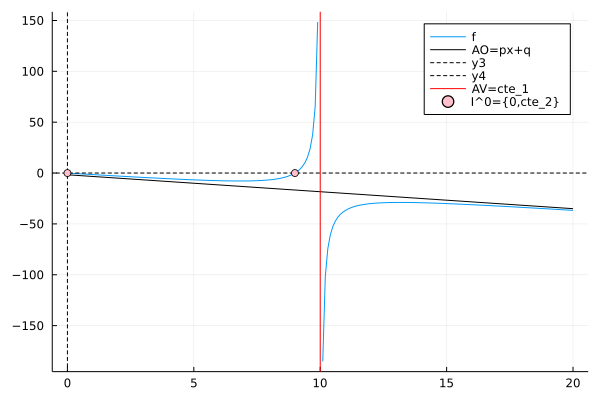

In [12]:
P_a=15
L=5
#######
#P_0=[L-1,L+1,cte_1+1]
P_0=10
#######
q_1=1
q_2=1
cte_1=2*q_1*L
cte_2=(L+2*q_2*L)/(1+2*q_2*L/P_a)
#######
f(P,P_a,L,q_1,q_2)=((1+2*q_2*(1-P/P_a))*L-P)*P/(P-2*q_1*L)
f_1(P)=f(P,P_a,L,q_1,q_2)
AO(x)=-(1+2*q_2*L/P_a)*x+L*(1+2*q_2-2*q_1-4*q_1*q_2*L/P_a)
#######
# calculo los 0s f'=P(x)/(x-2q_1L)^2 con P(x)=a*x^2+b*x+c
a=-(1+2*q_2*L/P_a)
b=4*q_1*L*(1+2*q_2*L/P_a)
c=-2*q_1*L^2*(1+2*q_2)
delta=b^2-4*a*c
x_1=(-b+sqrt(delta))/(2*a)
x_2=(-b-sqrt(delta))/(2*a)
#delta_2=16*q_1^2*L^2*(1+4*q_2*L/P_a+4*q_2^2*L^2/(P_a^2))-8*q_1*L^2*(1+2*q_2+2*q_2*L/P_a+4*q_2^2*L/P_a)
P=0:0.1:20
#plotlyjs()
plot(f_1,P,lab="f")
plot!(AO,P, lab="AO=px+q",c=:black)
vline!([0],linestyle=:dash, c=:black)
hline!([0],linestyle=:dash, c=:black)
# vline!([P_0[1]],lab="P_0[1]",linestyle=:dash,c=:orange)
# vline!([P_0[2]],lab="P_0[2]",linestyle=:dash,c=:orange)
# vline!([P_0[3]],lab="P_0[3]",linestyle=:dash,c=:orange)
#vline!([P_a],lab="P_a")
# vline!([L],lab="L")
vline!([cte_1],lab="AV=cte_1",c=:red)
scatter!([0,cte_2],[0,0],lab="I^0={0,cte_2}",c=:pink)
# scatter!([x_1,x_2],[f_1(x_1),f_1(x_2)],lab="I_{f'}^0={x_1,x_2}",c=:orange)

\begin{itemize}
    \item Si $P_0\in(0,cte_2)$, como $f$ es negativa, $P$ tenderá al equilibrio $0$.
    \item Si $P\in(cte_2,cte_1)$, tenderá a $cte_1$ donde se volvera inestable.
    \item Si $P_0\in (cte_1,+\infty)$ tenderá a decrecer fuertemente hasta tender al equilibrio $0$.
\end{itemize}

Chequeamos este comportamiento en la simulación. Para los valores de $P_0,P_a,L,q_1,q_2$ mostraremos tanto la función $f$ como la simulación para $P$.

In [47]:
P_a=15
L=5
#######
q_1=1
q_2=1
cte_1=2*q_1*L
cte_2=(L+2*q_2*L)/(1+2*q_2*L/P_a)
P_0=[cte_2-1,abs(cte_2+cte_1)/2,cte_1+1]
plots= Vector{Plots.Plot{Plots.GRBackend}}() #creo un vector de datos de tipo Plot
#plots= Vector{Plots.Plot{Plots.PlotlyJSBackend}}()
for p_0 in P_0
    push!(plots, caginalp_simple_sim(
            [p_0,#P_0
            P_a,#Pa=cte
            L],#L=cte
        (0.0,10),#t
        (tau_0=0.1,
            c=1,c_1=1,c_2=1,c_3=10,
            q=1,q_1=q_1,q_2=q_2)#parameters
    )[2])
end

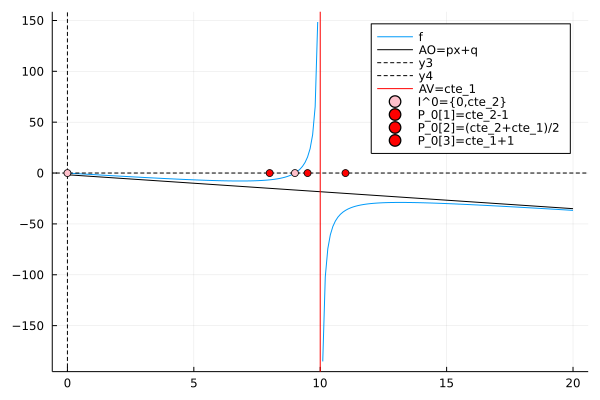

In [48]:
q_1=1
q_2=1
cte_1=2*q_1*L
cte_2=(L+2*q_2*L)/(1+2*q_2*L/P_a)
P_0=[cte_2-1,abs(cte_2+cte_1)/2,cte_1+1]
#######
f_1(P)=f(P,P_a,L,q_1,q_2)
AO(x)=-(1+2*q_2*L/P_a)*x+L*(1+2*q_2-2*q_1-4*q_1*q_2*L/P_a)
P=0:0.1:20
plot(f_1,P,lab="f")
plot!(AO,P, lab="AO=px+q",c=:black)
vline!([0],linestyle=:dash, c=:black)
hline!([0],linestyle=:dash, c=:black)
# vline!([P_0[1]],lab="P_0[1]",linestyle=:dash,c=:orange)
# vline!([P_0[2]],lab="P_0[2]",linestyle=:dash,c=:orange)
# vline!([P_0[3]],lab="P_0[3]",linestyle=:dash,c=:orange)
#vline!([P_a],lab="P_a")
# vline!([L],lab="L")
vline!([cte_1],lab="AV=cte_1",c=:red)
scatter!([0,cte_2],[0,0],lab="I^0={0,cte_2}",c=:pink)
scatter!([P_0[1]],[0],lab="P_0[1]=cte_2-1",c=:red)
scatter!([P_0[2]],[0],lab="P_0[2]=(cte_2+cte_1)/2",c=:red)
scatter!([P_0[3]],[0],lab="P_0[3]=cte_1+1",c=:red)
# scatter!([x_1,x_2],[f_1(x_1),f_1(x_2)],lab="I_{f'}^0={x_1,x_2}",c=:orange)

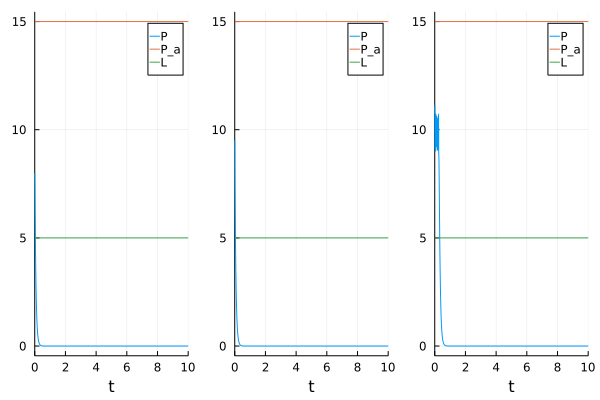

In [49]:
plot(plots[1], plots[2], plots[3], layout = (1, 3))

In [50]:
cte_1,cte_2

(10, 9.0)

## Estabilidad sin fundamental

Si consideramos el sistema para $q_2=0$, tendremos estabilidad sii
$$Q+\frac{1}{\tau_0}>0.$$

Definimos una función que resuelve numericamente el sistema y devuelve un vector con: un booleano indicando si la condición de estabilidad se cumple, el gráfico de la solución del sistema y la solución hallada.

In [51]:
function caginalp_sim(u_0,tspan,p)
    tau_0,c,c_1,c_2,c_3,q,q_1,q_2=p
    prob=ODEProblem(caginalp,u_0,tspan,p);
    sol=solve(prob);
    Q=1-q-2*q_1
    [Q+1/tau_0>0,# condicion de estabilidad
        plot(sol,label=["P" "P_a" "L" "zeta_1" "zeta_2"]),
    sol]
end

caginalp_sim (generic function with 1 method)

In [52]:
A=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        0,#zeta_1_0
        0],#zeta_2_0
    (0.0,20),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=1,q_1=0,q_2=0)#parameters
)
B=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        0,#zeta_1_0
        0],#zeta_2_0
    (0.0,20),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=15,q_1=0,q_2=0) #parameters
)
A[1],B[1]

(true, false)

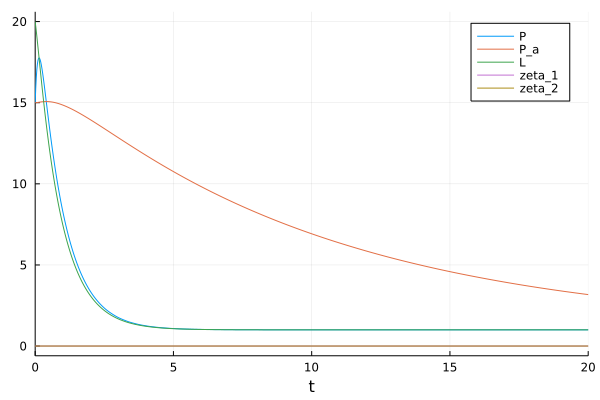

In [53]:
A[2]

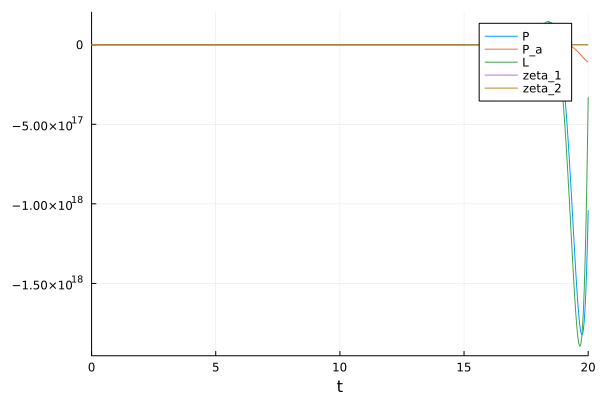

In [54]:
B[2]

In [55]:
#plot(A[2], B[2], layout = (2, 1))
#plot!(size=(600,600))

## El efecto de la liquidez con y sin sentimiento

### Sin sentiment ni fundamental
\begin{cases}
\begin{equation*}
        \begin{aligned}
        \tau_0P'&=L-P,\\
        cL'&=1+(q-1)L-qP,
    \end{aligned}
\end{equation*}
\end{cases}
es estable sii $q<1+\frac{c}{\tau_0}$.

In [56]:
A=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        0,#zeta_1_0
        0],#zeta_2_0
    (0.0,50),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=1,q_1=0,q_2=0)#parameters
)
B=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        0,#zeta_1_0
        0],#zeta_2_0
    (0,50),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=15,q_1=0,q_2=0) #parameters
)
A[1],B[1]

(true, false)

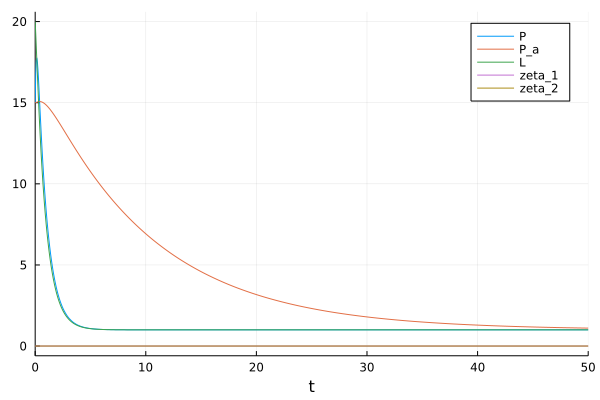

In [57]:
A[2]

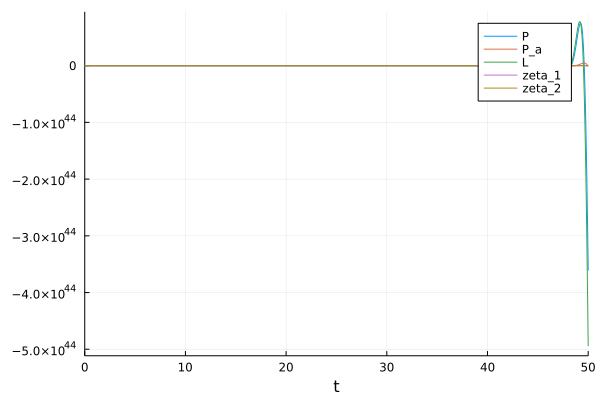

In [58]:
B[2]

In [59]:
# plot(A[2], B[2], layout = (2, 1))
# plot!(size=(600,600))

### Con sentiment pero sin fundamental
\begin{cases}
\begin{equation*}
        \begin{aligned}
        \tau_0P'&=(1+2\zeta_1)L-P,\\
        cL'&=1-L+q(1+2\zeta_1)L-qP,\\
        c_1\zeta_1'&=q_1\left((1+2\zeta_1)\frac{L}{P}-1\right)-\zeta_1,
    \end{aligned}
\end{equation*}
\end{cases}
es estable sii $Q+\frac{c}{\tau_0}>0$.

In [60]:
A=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        1,#zeta_1_0
        0],#zeta_2_0
    (0.0,20),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=1,q_1=1,q_2=1)#parameters
)
B=caginalp_sim(
        [15,#P_0
        15,#Pa_0
        20,#L_0
        1,#zeta_1_0
        0],#zeta_2_0
    (0.0,20),#t
    (tau_0=0.1,
        c=1,c_1=1,c_2=1,c_3=10,
        q=10,q_1=1,q_2=0) #parameters
)
A[1],B[1]

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/agustin/.julia/packages/SciMLBase/h4Gxc/src/integrator_interface.jl:351


(true, false)

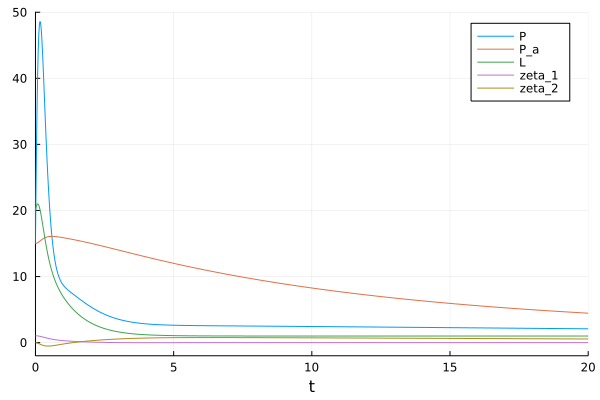

In [61]:
A[2]

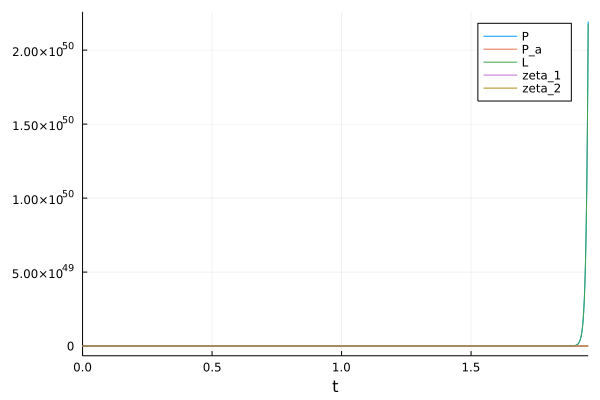

In [62]:
B[2]

In [63]:
# plot(A[2], B[2], layout = (2, 1))
# plot!(size=(600,600))